In [1]:
from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.applications.vgg16 import preprocess_input
from keras.applications.densenet import DenseNet121
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

In [2]:
# re-size all the images to this
IMAGE_SIZE = [224, 224]


train_path = 'D:/MountainGlacierWork/dataset/Train/'
valid_path = 'D:/MountainGlacierWork/dataset/Test/'

# add preprocessing layer to the front of VGG
mbnt = DenseNet121(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [3]:

import os
imageCount=0
row=1
for path, currentDirectory, files in os.walk("D:/MountainGlacierWork/dataset/Test/"):
    for file in files:
        print(os.path.join(path, file))
        imageCount=imageCount + 1

      

D:/MountainGlacierWork/dataset/Test/Glacier\1930.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1938.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1941.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1946.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1947.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1953.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1958.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1967.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1970.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1974.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1991.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\1998.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\2000.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\2010.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\2056.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\2066.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\2071.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\2072.jpg
D:/MountainGlacierWork/dataset/Test/Glacier\20

In [4]:
imageCount

300

In [5]:
# don't train existing weights
for layer in mbnt.layers:
    layer.trainable = False

In [6]:
  # useful for getting number of classes

folders = glob('D:/MountainGlacierWork/dataset/Train/*')
print(len(folders))

2


In [7]:
# our layers - you can add more if you want
x = Flatten()(mbnt.output)
x = Dense(50, activation='relu')(x)
x = Dense(50, activation='relu')(x)
prediction = Dense(len(folders), activation='softmax')(x)
#prediction = Dense(1, activation='sigmoid')(x)


In [8]:
# create a model object
model = Model(inputs=mbnt.input, outputs=prediction)

In [9]:
# view the structure of the model
model.summary()


Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

conv5_block2_concat (Concatenat (None, 7, 7, 576)    0           conv5_block1_concat[0][0]        
                                                                 conv5_block2_2_conv[0][0]        
__________________________________________________________________________________________________
conv5_block3_0_bn (BatchNormali (None, 7, 7, 576)    2304        conv5_block2_concat[0][0]        
__________________________________________________________________________________________________
conv5_block3_0_relu (Activation (None, 7, 7, 576)    0           conv5_block3_0_bn[0][0]          
__________________________________________________________________________________________________
conv5_block3_1_conv (Conv2D)    (None, 7, 7, 128)    73728       conv5_block3_0_relu[0][0]        
__________________________________________________________________________________________________
conv5_block3_1_bn (BatchNormali (None, 7, 7, 128)    512         conv5_block3_1_conv[0][0]        
__________

In [10]:
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [12]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)
      

training_set = train_datagen.flow_from_directory('D:/MountainGlacierWork/dataset/Train/',
                                                 target_size = (224, 224),
                                                 batch_size = 16,
                                                 class_mode = 'categorical')

test_set = test_datagen.flow_from_directory('D:/MountainGlacierWork/dataset/Test/',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 301 images belonging to 2 classes.
Found 300 images belonging to 2 classes.


In [13]:
import os
cats=[]
cat=[]

for path, currentDirectory, files in os.walk("D:/MountainGlacierWork/dataset/Train/"):
    for file in files:
        #print(os.path.join(path, file))
        #print(file)
        cats=path.split("\\")
        cats=cats[len(cats)-1]
        if cats not in cat:
            cat.append(cats)
            print(cats)
cat.sort()
print(cat)

#images,cls = next(test_set)



D:/MountainGlacierWork/dataset/Train/Glacier
D:/MountainGlacierWork/dataset/Train/Mountain
['D:/MountainGlacierWork/dataset/Train/Glacier', 'D:/MountainGlacierWork/dataset/Train/Mountain']


In [16]:
#images,cls = next(test_set)
#plt.imshow(images[3])
#plt.savefig('D:\\imageeee.png')
#print("ok")
#plt.show()

In [14]:
print(len(test_set))
print(len(training_set))

19
19


In [15]:
# fit the model
r = model.fit(
  training_set,
  validation_data=test_set,
  epochs=10,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/10
19/19 [==============================] - 85s 4s/step - loss: 0.9494 - accuracy: 0.6512 - val_loss: 0.4910 - val_accuracy: 0.8000
Epoch 2/10
19/19 [==============================] - 73s 4s/step - loss: 0.3768 - accuracy: 0.8439 - val_loss: 0.5418 - val_accuracy: 0.7767
Epoch 3/10
19/19 [==============================] - 73s 4s/step - loss: 0.3559 - accuracy: 0.8571 - val_loss: 0.7030 - val_accuracy: 0.7167
Epoch 4/10
19/19 [==============================] - 78s 4s/step - loss: 0.2491 - accuracy: 0.9103 - val_loss: 0.4073 - val_accuracy: 0.8433
Epoch 5/10
19/19 [==============================] - 75s 4s/step - loss: 0.2316 - accuracy: 0.8804 - val_loss: 0.4417 - val_accuracy: 0.8167
Epoch 6/10
19/19 [==============================] - 76s 4s/step - loss: 0.1812 - accuracy: 0.9369 - val_loss: 0.4427 - val_accuracy: 0.8200
Epoch 7/10
19/19 [==============================] - 99s 5s/step - loss: 0.1767 - accuracy: 0.9369 - val_loss: 0.4284 - val_accuracy: 0.8567
Epoch 8/10
19/19 [==

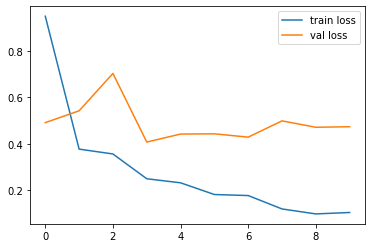

In [16]:
# loss
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()
#plt.savefig('LossVal_loss')

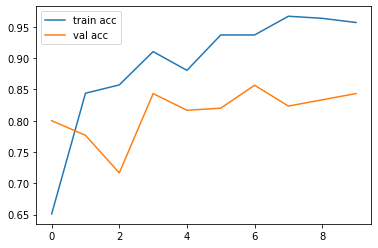

In [17]:
# accuracies
plt.plot(r.history['accuracy'], label='train acc')
plt.plot(r.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
#plt.savefig('AccVal_acc')

In [18]:
a, acc = model.evaluate(test_set)
print(acc)
print(a)

19/19 [==============================] - 35s 2s/step - loss: 0.4733 - accuracy: 0.8433
0.8433333039283752
0.47326284646987915


In [22]:
#model.save("D:/CatractImagesMobileNet/cataract/Mobile114Model.h4")

In [23]:
test_set = test_datagen.flow_from_directory("D:/MountainGlacierWork/dataset/Test/",
                                            target_size = (224, 224),
                                            batch_size = 40,
                                            class_mode = 'categorical')

pred = model.predict(test_set)
print(pred)

Found 520 images belonging to 2 classes.
[[6.7436634e-12 1.0000000e+00]
 [1.0000000e+00 2.3651059e-26]
 [1.0000000e+00 8.2400446e-36]
 ...
 [3.1397149e-20 1.0000000e+00]
 [1.0000000e+00 5.1378766e-20]
 [1.9560604e-23 1.0000000e+00]]


In [20]:
import xlsxwriter
workbook = xlsxwriter.Workbook('D:/MountainGlacierWork/fireOutput/FireImagesAnalysis.xlsx')
worksheet1 = workbook.add_worksheet()
row=0
col=0
imageCount=0
worksheet1.write(row, 0, str("ImageName"))
worksheet1.write(row, 1, str("Actual Class Code"))
worksheet1.write(row, 2, str("Actual Class Name"))
worksheet1.write(row, 3, str("Predicted Result"))
worksheet1.write(row, 4, str("Class Code Based on Predicted Result"))
worksheet1.write(row, 5, str("Predicted Class Name"))
worksheet1.write(row, 6, str("CF-Measure"))

# importing the modules
import os
import shutil
# Providing the folder path
origin = 'D:\\MountainGlacierWork\\dataset\\Test\\Mountain\\'
target1 = 'D:\\MountainGlacierWork\\TestCheck\\Mountain\\'

# Fetching the list of all the files
files = os.listdir(origin)
actual=[]
predicted=[]
ac=[]
pr=[]
# Fetching all the files to directory
row=1
for file_name in files:
    shutil.copy(origin+file_name, target1+file_name)
    print("Original" + str(origin+file_name))
    test_datagen = ImageDataGenerator(rescale = 1./255)
    test_set = test_datagen.flow_from_directory('D:\\MountainGlacierWork\\TestCheck\\',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')
    images,cls = next(test_set)
    filme=test_set.filenames
    #plt.imshow(images[0])
    worksheet1.write(row, 0, str(filme[0]))
    worksheet1.write(row, 1, str(cls[0]))
    worksheet1.write(row, 2, str("Mountain"))
    print("Actual")
    print(cls[0])
    print(cls[0][0])
    print(cls[0][1])
    actual.append(cls[0])
    ac.append("Mountain")
    print(filme[0])
    pred = model.predict(test_set)
    worksheet1.write(row, 3, str(pred))
    print("Predicted")
    print(pred)
    print(pred[0][0])
    print(pred[0][1])
    if(pred[0][0]>pred[0][1]):
        predicted.append([1.0,0.0])
        worksheet1.write(row, 4, str("[1.0,0.0]"))
        worksheet1.write(row, 5, str("Glacier"))
        worksheet1.write(row, 6, str("False Glacier"))
        pr.append("Glacier")
        print("Glacier")
    else:
        predicted.append([0.0,1.0])
        worksheet1.write(row, 4, str("[0.0,1.0]"))
        worksheet1.write(row, 5, str("Mountain"))
        worksheet1.write(row, 6, str("True Mountain"))
        pr.append("Mountain")
        print("Mountain")
    print("======================")
    path = r"D:\\MountainGlacierWork\\TestCheck\\Mountain\\"
    for fileN in os.listdir(path):
        # construct full file path
        fi = path + fileN
        if os.path.isfile(fi):
            print('Deleting file:', fi)
            os.remove(fi)
    row=row+1
print("Files are copied successfully")


OriginalD:\MountainGlacierWork\dataset\Test\Mountain\3915.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\3915.jpg
Predicted
[[0.67026    0.32974005]]
0.67026
0.32974005
Glacier
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\3915.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\3934.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\3934.jpg
Predicted
[[5.209796e-04 9.994790e-01]]
0.0005209796
0.999479
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\3934.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\3936.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\3936.jpg
Predicted
[[0.01470838 0.9852916 ]]
0.01470838
0.9852916
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\3936.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\3940.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\3940.jpg
Predicted
[[0.02158027

Predicted
[[0.04160196 0.95839804]]
0.04160196
0.95839804
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4154.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4155.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4155.jpg
Predicted
[[0.13506795 0.8649321 ]]
0.13506795
0.8649321
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4155.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4162.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4162.jpg
Predicted
[[0.02190568 0.9780943 ]]
0.02190568
0.9780943
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4162.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4163.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4163.jpg
Predicted
[[0.00488205 0.9951179 ]]
0.004882052
0.9951179
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4163.jpg
OriginalD:\MountainGlacierWo

Predicted
[[0.03078142 0.96921855]]
0.030781424
0.96921855
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4378.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4380.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4380.jpg
Predicted
[[0.04697942 0.9530206 ]]
0.046979424
0.9530206
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4380.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4384.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4384.jpg
Predicted
[[0.00124477 0.9987552 ]]
0.0012447698
0.9987552
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4384.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4387.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4387.jpg
Predicted
[[0.21858484 0.7814152 ]]
0.21858484
0.7814152
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4387.jpg
OriginalD:\MountainGlacie

Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4638.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4639.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4639.jpg
Predicted
[[0.7677338  0.23226619]]
0.7677338
0.23226619
Glacier
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4639.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4644.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4644.jpg
Predicted
[[0.12844472 0.87155527]]
0.12844472
0.87155527
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4644.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4672.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4672.jpg
Predicted
[[0.18520683 0.81479317]]
0.18520683
0.81479317
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4672.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4673.jpg
Found 1 images belonging to 2 cla

Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4924.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4927.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4927.jpg
Predicted
[[0.04863775 0.95136225]]
0.048637748
0.95136225
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4927.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4941.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4941.jpg
Predicted
[[0.06672534 0.9332747 ]]
0.066725336
0.9332747
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4941.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4951.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\4951.jpg
Predicted
[[0.09449182 0.9055082 ]]
0.094491825
0.9055082
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\4951.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\4953.jpg
Found 1 images belonging to 2 

Predicted
[[0.00762085 0.9923792 ]]
0.0076208534
0.9923792
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\5093.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\5094.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\5094.jpg
Predicted
[[0.05394396 0.94605607]]
0.05394396
0.94605607
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\5094.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\5117.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\5117.jpg
Predicted
[[0.0764477 0.9235523]]
0.0764477
0.9235523
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\5117.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Mountain\5119.jpg
Found 1 images belonging to 2 classes.
Actual
[0. 1.]
0.0
1.0
Mountain\5119.jpg
Predicted
[[0.00709606 0.992904  ]]
0.007096059
0.992904
Mountain
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Mountain\\5119.jpg
OriginalD:\MountainGlacierWork

In [21]:
import os
import shutil
# Providing the folder path
origin = 'D:\\MountainGlacierWork\\dataset\\Test\\Glacier\\'
target1 = 'D:\\MountainGlacierWork\\TestCheck\\Glacier\\'

# Fetching the list of all the files
files = os.listdir(origin)

# Fetching all the files to directory
for file_name in files:
    shutil.copy(origin+file_name, target1+file_name)
    print("Original" + str(origin+file_name))
    test_datagen = ImageDataGenerator(rescale = 1./255)
    test_set = test_datagen.flow_from_directory('D:\\MountainGlacierWork\\TestCheck\\',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')
    images,cls = next(test_set)
    filme=test_set.filenames
    
    #plt.imshow(images[0])
    worksheet1.write(row, 0, str(filme[0]))
    worksheet1.write(row, 1, str(cls[0]))
    worksheet1.write(row, 2, str("Glacier"))
    print("Actual")
    print(cls[0])
    print(cls[0][0])
    print(cls[0][1])
    actual.append(cls[0])
    ac.append("Glacier")
    print(filme[0])
    pred = model.predict(test_set)
    worksheet1.write(row, 3, str(pred))
    print("Predicted")
    print(pred)
    print(pred[0][0])
    print(pred[0][1])
    if(pred[0][0]>pred[0][1]):
        predicted.append([1.0,0.0])
        worksheet1.write(row, 4, str("[1.0,0.0]"))
        worksheet1.write(row, 5, str("Glacier"))
        worksheet1.write(row, 6, str("True Glacier"))
        pr.append("Glacier")
    else:
        predicted.append([0.0,1.0])
        worksheet1.write(row, 4, str("[0.0,1.0]"))
        worksheet1.write(row, 5, str("Mountain"))
        worksheet1.write(row, 6, str("False Mountain"))
        pr.append("Mountain")
    path = r"D:\\MountainGlacierWork\\TestCheck\\Glacier\\"
    for fileN in os.listdir(path):
        # construct full file path
        fi = path + fileN
        if os.path.isfile(fi):
            print('Deleting file:', fi)
            os.remove(fi)
    row=row+1
print("Files are copied successfully")
workbook.close()

OriginalD:\MountainGlacierWork\dataset\Test\Glacier\1930.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\1930.jpg
Predicted
[[9.9953175e-01 4.6826247e-04]]
0.99953175
0.00046826247
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\1930.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\1938.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\1938.jpg
Predicted
[[0.94824463 0.05175542]]
0.94824463
0.051755417
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\1938.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\1941.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\1941.jpg
Predicted
[[0.997224   0.00277604]]
0.997224
0.0027760419
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\1941.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\1946.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\1946.jpg
Predicted
[[9.9983799e-01 1.6193767e-04]]
0.99983

Predicted
[[9.9988663e-01 1.1332835e-04]]
0.99988663
0.00011332835
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2189.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2205.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2205.jpg
Predicted
[[0.02196533 0.9780346 ]]
0.021965334
0.9780346
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2205.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2223.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2223.jpg
Predicted
[[0.8928578  0.10714217]]
0.8928578
0.107142165
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2223.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2239.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2239.jpg
Predicted
[[0.0338088 0.9661912]]
0.033808798
0.9661912
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2239.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2243.jpg
Foun

Predicted
[[0.9196722  0.08032781]]
0.9196722
0.08032781
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2494.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2502.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2502.jpg
Predicted
[[9.9959296e-01 4.0701110e-04]]
0.99959296
0.0004070111
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2502.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2506.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2506.jpg
Predicted
[[0.9968317  0.00316824]]
0.9968317
0.0031682372
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2506.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2509.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2509.jpg
Predicted
[[0.17232352 0.8276765 ]]
0.17232352
0.8276765
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2509.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2510.jpg
Foun

Predicted
[[9.9994254e-01 5.7456480e-05]]
0.99994254
5.745648e-05
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2797.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2805.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2805.jpg
Predicted
[[0.9966788 0.0033212]]
0.9966788
0.0033211967
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2805.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2807.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2807.jpg
Predicted
[[0.02733775 0.97266227]]
0.027337752
0.97266227
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2807.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2821.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\2821.jpg
Predicted
[[0.03219077 0.9678092 ]]
0.03219077
0.9678092
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\2821.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\2826.jpg
Foun

Predicted
[[9.9981207e-01 1.8793051e-04]]
0.99981207
0.0001879305
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\3122.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\3131.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\3131.jpg
Predicted
[[0.00576716 0.99423283]]
0.0057671596
0.99423283
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\3131.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\3134.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\3134.jpg
Predicted
[[0.4391821  0.56081784]]
0.4391821
0.56081784
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\3134.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\3139.jpg
Found 1 images belonging to 2 classes.
Actual
[1. 0.]
1.0
0.0
Glacier\3139.jpg
Predicted
[[0.13434424 0.8656558 ]]
0.13434424
0.8656558
Deleting file: D:\\MountainGlacierWork\\TestCheck\\Glacier\\3139.jpg
OriginalD:\MountainGlacierWork\dataset\Test\Glacier\3148.jpg
Fou

In [22]:
ac

['Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',

In [23]:
pr

['Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',
 'Glacier',
 'Glacier',
 'Mountain',
 'Mountain',
 'Mountain',
 'Mountain',
 'Glacier',

In [24]:
from sklearn.metrics import classification_report
print(classification_report(actual,predicted))

              precision    recall  f1-score   support

           0       0.85      0.84      0.84       150
           1       0.84      0.85      0.84       150

   micro avg       0.84      0.84      0.84       300
   macro avg       0.84      0.84      0.84       300
weighted avg       0.84      0.84      0.84       300
 samples avg       0.84      0.84      0.84       300



In [25]:
from sklearn.metrics import classification_report
print(classification_report(ac,pr))


              precision    recall  f1-score   support

     Glacier       0.85      0.84      0.84       150
    Mountain       0.84      0.85      0.84       150

    accuracy                           0.84       300
   macro avg       0.84      0.84      0.84       300
weighted avg       0.84      0.84      0.84       300



In [26]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(ac, pr)
cm

array([[126,  24],
       [ 23, 127]], dtype=int64)

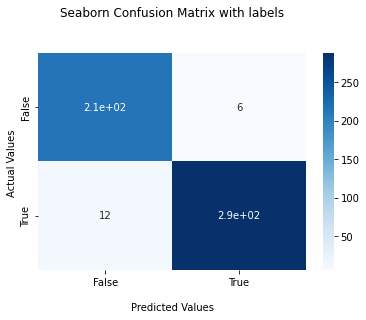

In [31]:
import seaborn as sns

ax = sns.heatmap(cm, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()





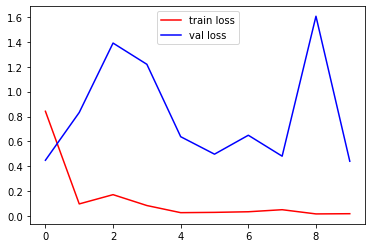

In [35]:
# loss
plt.figure(figsize=(6,4))
plt.plot(r.history['loss'], label='train loss', color="red")
plt.plot(r.history['val_loss'], label='val loss', color="blue")
plt.legend()
plt.show()
#plt.savefig('LossVal_loss')

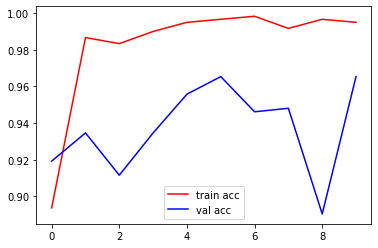

In [34]:
# accuracies
plt.figure(figsize=(6,4))
plt.plot(r.history['accuracy'], label='train acc', color="red")
plt.plot(r.history['val_accuracy'], label='val acc', color="blue")
plt.legend()
#plt.bar(r.history['accuracy'],height = 1.0)

plt.show()
#plt.savefig('AccVal_acc')



In [ ]:
#Applied Example

<class 'numpy.ndarray'>
(256, 256, 3)
<class 'PIL.Image.Image'>
RGB
(256, 256)


In [46]:
i=1
for d in data:
    print(d)
    print("=======================Row" + str(i))
    i=i+1

[[122 123 169]
 [131 132 178]
 [141 144 189]
 [148 151 196]
 [150 154 199]
 [151 158 202]
 [156 163 207]
 [159 168 211]
 [154 163 206]
 [151 160 203]
 [155 159 204]
 [157 161 206]
 [156 159 204]
 [149 152 197]
 [147 148 194]
 [152 146 190]
 [159 144 183]
 [161 144 180]
 [158 142 181]
 [149 138 178]
 [143 136 177]
 [139 138 178]
 [141 144 187]
 [142 149 191]
 [140 147 193]
 [140 148 194]
 [144 148 195]
 [143 147 194]
 [144 145 193]
 [146 144 193]
 [149 146 193]
 [154 146 193]
 [157 148 191]
 [158 146 186]
 [167 149 187]
 [172 151 184]
 [191 166 195]
 [241 216 237]
 [255 246 255]
 [247 228 232]
 [222 208 205]
 [204 194 184]
 [221 214 196]
 [226 218 197]
 [196 184 162]
 [195 179 154]
 [195 173 150]
 [160 129 108]
 [138  95  76]
 [143  94  77]
 [153 104  87]
 [155 106  89]
 [144  95  81]
 [143  94  80]
 [150 100  91]
 [148  98  89]
 [146  95  91]
 [149  98  95]
 [157 106 105]
 [163 111 113]
 [163 111 115]
 [161 109 113]
 [166 113 119]
 [176 121 127]
 [183 124 130]
 [179 123 126]
 [166 116 

[[156 151 183]
 [150 141 172]
 [142 129 157]
 [137 119 143]
 [137 115 136]
 [140 116 138]
 [142 120 143]
 [142 122 149]
 [144 129 162]
 [142 132 169]
 [142 135 176]
 [145 139 183]
 [147 141 185]
 [150 143 187]
 [154 143 186]
 [152 144 185]
 [147 144 187]
 [146 148 189]
 [150 152 193]
 [154 156 197]
 [156 158 197]
 [157 159 198]
 [156 158 197]
 [155 157 196]
 [156 158 196]
 [160 162 200]
 [164 166 204]
 [166 168 206]
 [167 170 205]
 [168 171 206]
 [169 172 207]
 [173 173 209]
 [176 172 209]
 [182 176 212]
 [175 171 206]
 [170 166 199]
 [178 175 204]
 [182 178 205]
 [182 177 200]
 [189 180 201]
 [192 179 197]
 [224 205 224]
 [235 211 227]
 [196 165 181]
 [181 145 159]
 [196 155 169]
 [192 148 161]
 [195 149 159]
 [193 147 150]
 [198 150 150]
 [201 151 152]
 [202 151 148]
 [204 151 145]
 [204 150 140]
 [207 150 139]
 [209 151 137]
 [212 153 137]
 [214 153 135]
 [216 155 137]
 [215 157 137]
 [217 159 139]
 [219 161 141]
 [219 162 142]
 [221 163 143]
 [225 164 146]
 [225 164 146]
 [223 166 

[[137 124 152]
 [126 116 143]
 [150 141 168]
 [197 191 219]
 [209 204 236]
 [175 174 206]
 [151 151 185]
 [152 155 190]
 [151 153 191]
 [152 154 192]
 [155 153 190]
 [155 151 188]
 [153 147 183]
 [152 144 181]
 [155 143 181]
 [158 143 176]
 [149 129 156]
 [149 125 149]
 [146 122 146]
 [147 122 144]
 [148 123 145]
 [150 125 146]
 [152 124 146]
 [152 125 144]
 [153 124 142]
 [153 125 140]
 [156 125 140]
 [157 126 141]
 [159 127 140]
 [160 128 141]
 [160 128 141]
 [162 129 140]
 [166 130 140]
 [166 133 142]
 [163 133 141]
 [155 132 138]
 [200 185 188]
 [255 249 250]
 [255 255 253]
 [252 255 253]
 [251 255 253]
 [249 255 253]
 [249 255 253]
 [251 255 251]
 [254 255 253]
 [255 255 251]
 [255 254 253]
 [255 255 250]
 [242 248 234]
 [252 255 236]
 [250 250 214]
 [245 242 197]
 [253 253 203]
 [249 255 202]
 [237 251 198]
 [240 254 201]
 [254 255 205]
 [249 243 183]
 [231 210 145]
 [223 193 131]
 [232 200 149]
 [239 213 176]
 [243 231 209]
 [255 251 240]
 [255 255 248]
 [255 255 250]
 [255 255 

 [159 121 134]]
=======================Row156
[[135 116 144]
 [143 127 156]
 [158 143 174]
 [169 158 192]
 [173 165 202]
 [170 165 205]
 [159 158 200]
 [150 153 196]
 [151 154 199]
 [150 153 196]
 [150 151 195]
 [149 151 192]
 [151 151 189]
 [154 152 189]
 [159 153 189]
 [159 155 190]
 [153 151 190]
 [154 153 193]
 [157 155 194]
 [160 158 197]
 [162 160 199]
 [164 162 201]
 [166 162 199]
 [167 163 200]
 [166 162 199]
 [167 163 200]
 [168 162 198]
 [169 163 199]
 [168 162 198]
 [168 162 198]
 [167 161 195]
 [167 162 194]
 [165 162 193]
 [167 160 193]
 [174 158 195]
 [175 157 199]
 [173 156 201]
 [167 156 199]
 [159 157 196]
 [160 156 189]
 [171 157 183]
 [183 154 172]
 [195 145 154]
 [204 145 141]
 [213 151 130]
 [251 195 158]
 [231 190 138]
 [221 191 131]
 [230 205 148]
 [255 236 179]
 [247 216 159]
 [215 180 122]
 [223 184 125]
 [228 192 134]
 [227 196 142]
 [240 216 168]
 [255 250 211]
 [255 255 226]
 [255 255 236]
 [252 255 241]
 [252 255 246]
 [255 255 250]
 [255 255 251]
 [255 255

 [122  91  97]]
=======================Row205
[[159 110 116]
 [156 109 115]
 [153 111 115]
 [154 113 117]
 [156 117 118]
 [158 118 119]
 [156 114 116]
 [155 109 111]
 [155 103 107]
 [162 107 110]
 [168 112 115]
 [165 110 113]
 [158 108 107]
 [153 108 105]
 [155 114 110]
 [159 121 120]
 [154 115 120]
 [164 131 150]
 [165 143 181]
 [169 148 187]
 [174 146 168]
 [159 126 133]
 [146 108 107]
 [142 110 113]
 [158 135 161]
 [168 151 183]
 [177 154 180]
 [159 131 145]
 [130  94  96]
 [119  84  90]
 [140 116 142]
 [176 152 186]
 [179 146 177]
 [178 144 161]
 [175 145 135]
 [180 154 141]
 [185 158 163]
 [175 151 167]
 [176 152 178]
 [193 172 187]
 [233 219 206]
 [253 242 220]
 [192 180 166]
 [181 167 167]
 [183 166 184]
 [184 167 183]
 [213 200 191]
 [214 202 178]
 [176 164 138]
 [169 155 144]
 [175 154 171]
 [178 159 181]
 [218 199 205]
 [209 195 186]
 [197 182 163]
 [177 164 148]
 [171 151 160]
 [171 153 167]
 [214 195 199]
 [251 236 229]
 [255 246 225]
 [220 206 195]
 [174 153 172]
 [176 156

 [124  88  92]]
=======================Row250
[[135 102 119]
 [135 102 119]
 [136 103 120]
 [136 103 120]
 [136 103 120]
 [137 104 121]
 [138 104 121]
 [138 104 121]
 [136 102 119]
 [139 105 122]
 [143 106 124]
 [144 107 125]
 [142 105 123]
 [141 104 122]
 [142 103 122]
 [142 103 122]
 [146 107 125]
 [145 107 122]
 [144 106 121]
 [144 106 121]
 [144 106 121]
 [145 107 120]
 [148 107 121]
 [148 107 121]
 [150 108 122]
 [152 110 122]
 [154 112 124]
 [152 110 120]
 [149 106 116]
 [148 105 115]
 [151 108 118]
 [154 111 121]
 [156 110 121]
 [156 110 120]
 [156 110 120]
 [155 110 117]
 [154 107 115]
 [151 104 110]
 [148 102 105]
 [146 100 103]
 [151 102 105]
 [155 107 107]
 [160 110 111]
 [161 111 110]
 [159 109 108]
 [155 106 102]
 [152 102 101]
 [152 101  98]
 [159 100 102]
 [160 100 100]
 [161 101 101]
 [161 101 101]
 [161 101 101]
 [161 101 100]
 [160 101  97]
 [160 101  97]
 [160 101  95]
 [161 102  96]
 [162 103  95]
 [166 107  99]
 [169 111 100]
 [169 111 100]
 [167 109  98]
 [164 106

In [47]:
i=1
for d in data:
    print(d/255)
    print("=======================Row" + str(i))
    i=i+1

[[0.47843137 0.48235294 0.6627451 ]
 [0.51372549 0.51764706 0.69803922]
 [0.55294118 0.56470588 0.74117647]
 [0.58039216 0.59215686 0.76862745]
 [0.58823529 0.60392157 0.78039216]
 [0.59215686 0.61960784 0.79215686]
 [0.61176471 0.63921569 0.81176471]
 [0.62352941 0.65882353 0.82745098]
 [0.60392157 0.63921569 0.80784314]
 [0.59215686 0.62745098 0.79607843]
 [0.60784314 0.62352941 0.8       ]
 [0.61568627 0.63137255 0.80784314]
 [0.61176471 0.62352941 0.8       ]
 [0.58431373 0.59607843 0.77254902]
 [0.57647059 0.58039216 0.76078431]
 [0.59607843 0.57254902 0.74509804]
 [0.62352941 0.56470588 0.71764706]
 [0.63137255 0.56470588 0.70588235]
 [0.61960784 0.55686275 0.70980392]
 [0.58431373 0.54117647 0.69803922]
 [0.56078431 0.53333333 0.69411765]
 [0.54509804 0.54117647 0.69803922]
 [0.55294118 0.56470588 0.73333333]
 [0.55686275 0.58431373 0.74901961]
 [0.54901961 0.57647059 0.75686275]
 [0.54901961 0.58039216 0.76078431]
 [0.56470588 0.58039216 0.76470588]
 [0.56078431 0.57647059 0.76

[[0.54509804 0.49411765 0.61176471]
 [0.50196078 0.45882353 0.58431373]
 [0.63529412 0.61568627 0.74117647]
 [0.70980392 0.71372549 0.83529412]
 [0.66666667 0.69019608 0.81568627]
 [0.65882353 0.69411765 0.82352941]
 [0.63921569 0.67058824 0.81176471]
 [0.65098039 0.67058824 0.81960784]
 [0.61960784 0.61568627 0.78039216]
 [0.58039216 0.56862745 0.7372549 ]
 [0.55686275 0.53333333 0.70588235]
 [0.55294118 0.52941176 0.70196078]
 [0.55294118 0.54509804 0.70196078]
 [0.56078431 0.55686275 0.71372549]
 [0.57647059 0.59215686 0.74117647]
 [0.60392157 0.62352941 0.78039216]
 [0.59215686 0.61960784 0.79215686]
 [0.57647059 0.60392157 0.78431373]
 [0.56862745 0.57254902 0.74509804]
 [0.57254902 0.55294118 0.71372549]
 [0.56862745 0.5372549  0.69019608]
 [0.57254902 0.5254902  0.68235294]
 [0.56862745 0.51764706 0.68627451]
 [0.55686275 0.52156863 0.69019608]
 [0.59215686 0.56078431 0.74509804]
 [0.57254902 0.56078431 0.74509804]
 [0.58431373 0.57647059 0.76078431]
 [0.61568627 0.61176471 0.78

 [0.91372549 0.77647059 0.61960784]]
=======================Row40
[[0.61568627 0.62745098 0.74901961]
 [0.70196078 0.71372549 0.83529412]
 [0.69411765 0.70980392 0.84705882]
 [0.62745098 0.64313725 0.78823529]
 [0.60784314 0.61568627 0.76862745]
 [0.59607843 0.59607843 0.74509804]
 [0.56470588 0.54117647 0.68235294]
 [0.54901961 0.50588235 0.63921569]
 [0.54509804 0.47843137 0.61176471]
 [0.56862745 0.48627451 0.60784314]
 [0.58823529 0.50588235 0.62745098]
 [0.61568627 0.54117647 0.66666667]
 [0.63529412 0.58039216 0.71764706]
 [0.63921569 0.60784314 0.76078431]
 [0.63137255 0.62745098 0.79215686]
 [0.63921569 0.62745098 0.79607843]
 [0.64313725 0.60392157 0.74901961]
 [0.63529412 0.58039216 0.71764706]
 [0.62352941 0.55686275 0.69019608]
 [0.63921569 0.56470588 0.69019608]
 [0.68627451 0.58823529 0.71372549]
 [0.72941176 0.62745098 0.74117647]
 [0.76862745 0.65098039 0.76078431]
 [0.78823529 0.65882353 0.76470588]
 [0.76470588 0.63921569 0.73333333]
 [0.77647059 0.65098039 0.74117647

[[0.62352941 0.60784314 0.7372549 ]
 [0.59215686 0.57254902 0.69803922]
 [0.55686275 0.51372549 0.63137255]
 [0.53333333 0.47058824 0.57254902]
 [0.5372549  0.45098039 0.54117647]
 [0.54509804 0.45098039 0.5372549 ]
 [0.55294118 0.46666667 0.55686275]
 [0.55294118 0.4745098  0.58039216]
 [0.56078431 0.50196078 0.62352941]
 [0.55686275 0.50980392 0.65098039]
 [0.56078431 0.52941176 0.69019608]
 [0.56862745 0.54117647 0.70588235]
 [0.58039216 0.55294118 0.71764706]
 [0.58823529 0.56078431 0.7254902 ]
 [0.60392157 0.56078431 0.7254902 ]
 [0.59607843 0.56470588 0.7254902 ]
 [0.57647059 0.56470588 0.73333333]
 [0.58431373 0.58039216 0.74509804]
 [0.6        0.59607843 0.76078431]
 [0.61568627 0.61176471 0.77647059]
 [0.62745098 0.62352941 0.78039216]
 [0.62745098 0.62352941 0.78039216]
 [0.61568627 0.61176471 0.76862745]
 [0.60784314 0.60392157 0.76078431]
 [0.61960784 0.61960784 0.76862745]
 [0.63137255 0.63137255 0.78039216]
 [0.64705882 0.64705882 0.79607843]
 [0.65490196 0.65490196 0.80

 [1.         0.96862745 0.78823529]]
=======================Row72
[[0.53333333 0.40784314 0.41960784]
 [0.54509804 0.42352941 0.44313725]
 [0.55686275 0.43921569 0.47058824]
 [0.54901961 0.43921569 0.49411765]
 [0.5372549  0.44705882 0.51764706]
 [0.54117647 0.4627451  0.56078431]
 [0.56470588 0.50196078 0.61568627]
 [0.58823529 0.53333333 0.67058824]
 [0.59215686 0.54901961 0.70588235]
 [0.58431373 0.55686275 0.71764706]
 [0.57254902 0.55294118 0.71372549]
 [0.55294118 0.54117647 0.70980392]
 [0.54117647 0.52941176 0.69803922]
 [0.55686275 0.55294118 0.71764706]
 [0.6        0.59607843 0.76078431]
 [0.63529412 0.63529412 0.77647059]
 [0.72156863 0.7372549  0.85098039]
 [0.75294118 0.77647059 0.8627451 ]
 [0.77647059 0.8        0.89411765]
 [0.76078431 0.78431373 0.87843137]
 [0.73333333 0.76470588 0.85490196]
 [0.72941176 0.76078431 0.85098039]
 [0.73333333 0.76078431 0.8627451 ]
 [0.7372549  0.76470588 0.86666667]
 [0.70588235 0.7254902  0.83921569]
 [0.70588235 0.72156863 0.83529412

[[0.52156863 0.40392157 0.37254902]
 [0.56078431 0.43921569 0.42745098]
 [0.54509804 0.43137255 0.45098039]
 [0.51764706 0.41568627 0.46666667]
 [0.5372549  0.44313725 0.5372549 ]
 [0.5372549  0.4627451  0.57254902]
 [0.5254902  0.46666667 0.58823529]
 [0.5372549  0.49411765 0.61960784]
 [0.58039216 0.55686275 0.65882353]
 [0.65882353 0.65098039 0.7372549 ]
 [0.75294118 0.76470588 0.83921569]
 [0.83137255 0.85490196 0.91764706]
 [0.89411765 0.92156863 0.98431373]
 [0.90588235 0.93333333 0.99607843]
 [0.81960784 0.85490196 0.92156863]
 [0.72156863 0.74509804 0.83137255]
 [0.67058824 0.69019608 0.80392157]
 [0.65098039 0.6627451  0.79215686]
 [0.61568627 0.62745098 0.75686275]
 [0.58823529 0.58823529 0.72156863]
 [0.56862745 0.56078431 0.70588235]
 [0.56862745 0.55294118 0.69803922]
 [0.57254902 0.54901961 0.69803922]
 [0.57254902 0.54901961 0.69803922]
 [0.59607843 0.55294118 0.70980392]
 [0.6        0.56078431 0.70588235]
 [0.60392157 0.55686275 0.69803922]
 [0.61176471 0.55686275 0.69

[[0.58039216 0.4627451  0.55686275]
 [0.57254902 0.4627451  0.55294118]
 [0.54509804 0.45882353 0.54901961]
 [0.54509804 0.4745098  0.56862745]
 [0.6        0.56078431 0.65882353]
 [0.70980392 0.69411765 0.79215686]
 [0.79215686 0.79607843 0.90588235]
 [0.82352941 0.83921569 0.95294118]
 [0.74117647 0.76078431 0.87843137]
 [0.64705882 0.66666667 0.78431373]
 [0.58431373 0.59607843 0.7254902 ]
 [0.59607843 0.59607843 0.72941176]
 [0.61568627 0.6        0.72941176]
 [0.59607843 0.57254902 0.70588235]
 [0.58823529 0.56078431 0.69411765]
 [0.61568627 0.56862745 0.70980392]
 [0.61960784 0.56470588 0.70196078]
 [0.61176471 0.54901961 0.69019608]
 [0.59215686 0.52941176 0.67058824]
 [0.57647059 0.50980392 0.64313725]
 [0.57254902 0.49803922 0.61568627]
 [0.57254902 0.49411765 0.60392157]
 [0.57254902 0.49411765 0.59215686]
 [0.58039216 0.49411765 0.58431373]
 [0.59215686 0.49411765 0.57647059]
 [0.58823529 0.49019608 0.56470588]
 [0.59607843 0.49019608 0.54901961]
 [0.60392157 0.49411765 0.54

 [0.58039216 0.46666667 0.54509804]]
=======================Row120
[[0.54509804 0.51372549 0.65882353]
 [0.56078431 0.52941176 0.6745098 ]
 [0.54901961 0.5254902  0.66666667]
 [0.52941176 0.50588235 0.64705882]
 [0.53333333 0.50980392 0.65098039]
 [0.56470588 0.54117647 0.68235294]
 [0.58431373 0.55294118 0.69803922]
 [0.57647059 0.54901961 0.68235294]
 [0.58039216 0.54117647 0.67843137]
 [0.58431373 0.54117647 0.66666667]
 [0.58431373 0.53333333 0.65098039]
 [0.57647059 0.51372549 0.61960784]
 [0.56470588 0.49411765 0.59607843]
 [0.54901961 0.4745098  0.56078431]
 [0.54509804 0.45882353 0.54901961]
 [0.54509804 0.45098039 0.5372549 ]
 [0.57647059 0.46666667 0.55294118]
 [0.58039216 0.47058824 0.55686275]
 [0.58823529 0.47843137 0.56470588]
 [0.59607843 0.49019608 0.56470588]
 [0.6        0.49411765 0.56862745]
 [0.6        0.49411765 0.56862745]
 [0.59607843 0.49019608 0.56470588]
 [0.59607843 0.49019608 0.55686275]
 [0.6        0.49411765 0.56078431]
 [0.6        0.49411765 0.5529411

[[0.58823529 0.59607843 0.74901961]
 [0.59215686 0.6        0.75294118]
 [0.59607843 0.60392157 0.75686275]
 [0.6        0.60784314 0.76078431]
 [0.60392157 0.6        0.75686275]
 [0.6        0.59607843 0.75294118]
 [0.59607843 0.58823529 0.74509804]
 [0.59215686 0.58431373 0.74117647]
 [0.59215686 0.58431373 0.7372549 ]
 [0.60392157 0.58431373 0.74117647]
 [0.61176471 0.59215686 0.74901961]
 [0.61568627 0.59607843 0.75294118]
 [0.61568627 0.58823529 0.74901961]
 [0.60392157 0.57647059 0.7372549 ]
 [0.59215686 0.56470588 0.7254902 ]
 [0.58431373 0.55686275 0.71764706]
 [0.59607843 0.57647059 0.7372549 ]
 [0.58039216 0.57254902 0.72941176]
 [0.58823529 0.56862745 0.72941176]
 [0.59215686 0.57254902 0.73333333]
 [0.60392157 0.57647059 0.7372549 ]
 [0.60784314 0.58039216 0.74117647]
 [0.61568627 0.57254902 0.72941176]
 [0.61176471 0.56862745 0.7254902 ]
 [0.60392157 0.55686275 0.71372549]
 [0.60392157 0.54509804 0.69803922]
 [0.60392157 0.54117647 0.69411765]
 [0.61176471 0.54117647 0.69

 [0.62352941 0.4745098  0.5254902 ]]
=======================Row156
[[0.52941176 0.45490196 0.56470588]
 [0.56078431 0.49803922 0.61176471]
 [0.61960784 0.56078431 0.68235294]
 [0.6627451  0.61960784 0.75294118]
 [0.67843137 0.64705882 0.79215686]
 [0.66666667 0.64705882 0.80392157]
 [0.62352941 0.61960784 0.78431373]
 [0.58823529 0.6        0.76862745]
 [0.59215686 0.60392157 0.78039216]
 [0.58823529 0.6        0.76862745]
 [0.58823529 0.59215686 0.76470588]
 [0.58431373 0.59215686 0.75294118]
 [0.59215686 0.59215686 0.74117647]
 [0.60392157 0.59607843 0.74117647]
 [0.62352941 0.6        0.74117647]
 [0.62352941 0.60784314 0.74509804]
 [0.6        0.59215686 0.74509804]
 [0.60392157 0.6        0.75686275]
 [0.61568627 0.60784314 0.76078431]
 [0.62745098 0.61960784 0.77254902]
 [0.63529412 0.62745098 0.78039216]
 [0.64313725 0.63529412 0.78823529]
 [0.65098039 0.63529412 0.78039216]
 [0.65490196 0.63921569 0.78431373]
 [0.65098039 0.63529412 0.78039216]
 [0.65490196 0.63921569 0.7843137

 [0.60784314 0.45098039 0.48627451]]
=======================Row171
[[0.64705882 0.55294118 0.65490196]
 [0.64705882 0.55294118 0.64705882]
 [0.65098039 0.54901961 0.64705882]
 [0.64705882 0.54901961 0.63529412]
 [0.65882353 0.54117647 0.63529412]
 [0.65882353 0.54509804 0.63137255]
 [0.6627451  0.5372549  0.62745098]
 [0.6627451  0.5372549  0.61960784]
 [0.65098039 0.52941176 0.6       ]
 [0.63921569 0.53333333 0.6       ]
 [0.65098039 0.55686275 0.61176471]
 [0.58823529 0.50980392 0.55294118]
 [0.43921569 0.37647059 0.41568627]
 [0.34509804 0.30196078 0.3254902 ]
 [0.3372549  0.30196078 0.32156863]
 [0.34117647 0.30196078 0.30588235]
 [0.43137255 0.35294118 0.34901961]
 [0.45882353 0.36470588 0.35686275]
 [0.41568627 0.32156863 0.32156863]
 [0.39607843 0.29803922 0.30980392]
 [0.50196078 0.39607843 0.41568627]
 [0.61176471 0.50588235 0.53333333]
 [0.65882353 0.54117647 0.58039216]
 [0.66666667 0.54901961 0.58823529]
 [0.67058824 0.54509804 0.59607843]
 [0.6745098  0.54117647 0.5960784

 [0.59607843 0.43529412 0.45882353]]
=======================Row187
[[0.71372549 0.53333333 0.54509804]
 [0.70980392 0.53333333 0.54509804]
 [0.70196078 0.5372549  0.54509804]
 [0.69803922 0.54509804 0.54901961]
 [0.69803922 0.54509804 0.55686275]
 [0.69019608 0.54901961 0.55686275]
 [0.70196078 0.54117647 0.55686275]
 [0.70588235 0.54509804 0.56078431]
 [0.70588235 0.52941176 0.55686275]
 [0.71372549 0.54509804 0.57254902]
 [0.72156863 0.56078431 0.59215686]
 [0.65882353 0.52156863 0.54509804]
 [0.43137255 0.32941176 0.34117647]
 [0.30196078 0.23137255 0.23137255]
 [0.32941176 0.29019608 0.28235294]
 [0.27058824 0.23921569 0.22745098]
 [0.29803922 0.24313725 0.23921569]
 [0.38039216 0.31372549 0.34509804]
 [0.56862745 0.47843137 0.59215686]
 [0.69411765 0.6        0.70196078]
 [0.68627451 0.6        0.60784314]
 [0.44705882 0.36470588 0.29803922]
 [0.43137255 0.3372549  0.23529412]
 [0.58431373 0.4745098  0.41960784]
 [0.6627451  0.5254902  0.60392157]
 [0.70980392 0.56470588 0.6980392

[[0.61176471 0.42745098 0.45098039]
 [0.58823529 0.41176471 0.43137255]
 [0.56470588 0.4        0.41568627]
 [0.56078431 0.4        0.41568627]
 [0.57254902 0.41960784 0.42352941]
 [0.6        0.44313725 0.44705882]
 [0.61568627 0.45098039 0.45882353]
 [0.63137255 0.45098039 0.4627451 ]
 [0.64313725 0.43921569 0.45490196]
 [0.64705882 0.43137255 0.45098039]
 [0.64705882 0.43137255 0.45098039]
 [0.64313725 0.43921569 0.44705882]
 [0.63921569 0.45098039 0.45098039]
 [0.60784314 0.44705882 0.43921569]
 [0.56862745 0.43137255 0.41568627]
 [0.53333333 0.40784314 0.41960784]
 [0.54901961 0.41960784 0.49411765]
 [0.61176471 0.50980392 0.62352941]
 [0.63529412 0.58039216 0.70980392]
 [0.64313725 0.6        0.7254902 ]
 [0.67058824 0.58039216 0.69019608]
 [0.61176471 0.50196078 0.58823529]
 [0.54509804 0.41568627 0.48235294]
 [0.51372549 0.4        0.47058824]
 [0.61568627 0.55294118 0.65490196]
 [0.63529412 0.59607843 0.70196078]
 [0.65098039 0.58823529 0.69019608]
 [0.61176471 0.51764706 0.61

[[0.57647059 0.42352941 0.43529412]
 [0.54901961 0.39607843 0.40784314]
 [0.54901961 0.39215686 0.39607843]
 [0.56862745 0.40392157 0.40784314]
 [0.56470588 0.39215686 0.38823529]
 [0.54901961 0.37254902 0.35294118]
 [0.57647059 0.39215686 0.36862745]
 [0.61960784 0.42745098 0.4       ]
 [0.62745098 0.43529412 0.40784314]
 [0.59607843 0.40392157 0.37647059]
 [0.54901961 0.36078431 0.32156863]
 [0.60392157 0.41568627 0.37647059]
 [0.61960784 0.43529412 0.40392157]
 [0.6        0.41568627 0.38431373]
 [0.61568627 0.43137255 0.4       ]
 [0.54117647 0.38431373 0.35294118]
 [0.56078431 0.44313725 0.40392157]
 [0.60784314 0.51764706 0.54117647]
 [0.65098039 0.59607843 0.7254902 ]
 [0.65490196 0.60784314 0.74901961]
 [0.68627451 0.61568627 0.67058824]
 [0.5254902  0.43137255 0.41568627]
 [0.59215686 0.48235294 0.42745098]
 [0.62352941 0.5254902  0.49803922]
 [0.63921569 0.58039216 0.67058824]
 [0.64705882 0.60392157 0.72941176]
 [0.65490196 0.59607843 0.67058824]
 [0.62745098 0.54901961 0.55

[[0.21960784 0.17254902 0.21960784]
 [0.22745098 0.18823529 0.23137255]
 [0.24313725 0.19607843 0.24313725]
 [0.24313725 0.19607843 0.24313725]
 [0.24313725 0.19607843 0.24313725]
 [0.24313725 0.19607843 0.24313725]
 [0.25098039 0.19607843 0.24705882]
 [0.25098039 0.19607843 0.24705882]
 [0.2627451  0.2        0.25098039]
 [0.25098039 0.18823529 0.23921569]
 [0.23921569 0.16862745 0.22352941]
 [0.23137255 0.16078431 0.21568627]
 [0.22745098 0.15686275 0.21176471]
 [0.22352941 0.15294118 0.20784314]
 [0.22745098 0.14509804 0.20392157]
 [0.21176471 0.14117647 0.18823529]
 [0.15294118 0.10980392 0.14117647]
 [0.39607843 0.35294118 0.40784314]
 [0.65098039 0.6        0.70980392]
 [0.66666667 0.61568627 0.73333333]
 [0.5372549  0.49019608 0.56862745]
 [0.23921569 0.2        0.24313725]
 [0.17254902 0.13333333 0.16470588]
 [0.28627451 0.24705882 0.29019608]
 [0.65882353 0.60784314 0.71764706]
 [0.67058824 0.61568627 0.74509804]
 [0.58431373 0.53333333 0.64313725]
 [0.30196078 0.25490196 0.33

[[0.53333333 0.40392157 0.47058824]
 [0.53333333 0.41176471 0.4745098 ]
 [0.5372549  0.40784314 0.4745098 ]
 [0.53333333 0.40392157 0.47058824]
 [0.53333333 0.40392157 0.47058824]
 [0.52941176 0.4        0.46666667]
 [0.52941176 0.39607843 0.4627451 ]
 [0.52941176 0.39607843 0.4627451 ]
 [0.54117647 0.40784314 0.4745098 ]
 [0.54901961 0.41568627 0.48235294]
 [0.56078431 0.41568627 0.48627451]
 [0.56078431 0.41568627 0.48627451]
 [0.55686275 0.41176471 0.48235294]
 [0.55294118 0.40784314 0.47843137]
 [0.56078431 0.40784314 0.48235294]
 [0.56470588 0.41176471 0.48235294]
 [0.57254902 0.42352941 0.48235294]
 [0.57647059 0.42745098 0.48627451]
 [0.57647059 0.42745098 0.48627451]
 [0.58039216 0.43137255 0.48235294]
 [0.58039216 0.43137255 0.48235294]
 [0.58039216 0.43137255 0.48235294]
 [0.58823529 0.42745098 0.48235294]
 [0.58823529 0.43137255 0.4745098 ]
 [0.60784314 0.44313725 0.49019608]
 [0.61176471 0.44705882 0.49411765]
 [0.61176471 0.44705882 0.48627451]
 [0.60392157 0.43921569 0.47

In [40]:
test_datagen = ImageDataGenerator(rescale = 1./255)  
testset = test_datagen.flow_from_directory('D:\JungSenWork\AppliedExample',
                                            target_size = (224, 224),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 1 images belonging to 2 classes.


In [41]:
for t in testset:
    print(t)

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

         [0.48627454, 0.3254902 , 0.34117648]]]], dtype=float32), array([[0., 1.]], dtype=float32))
(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

     

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

(array([[[[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5137255 , 0.5176471 , 0.69803923],
         [0.5529412 , 0.5647059 , 0.7411765 ],
         ...,
         [0.43529415, 0.3647059 , 0.4666667 ],
         [0.43137258, 0.36862746, 0.47450984],
         [0.43529415, 0.37254903, 0.4784314 ]],

        [[0.4784314 , 0.48235297, 0.6627451 ],
         [0.5176471 , 0.52156866, 0.7019608 ],
         [0.56078434, 0.57254905, 0.7490196 ],
         ...,
         [0.43921572, 0.36862746, 0.47058827],
         [0.43921572, 0.3647059 , 0.47450984],
         [0.43137258, 0.36862746, 0.47450984]],

        [[0.48235297, 0.48627454, 0.6666667 ],
         [0.5294118 , 0.53333336, 0.7137255 ],
         [0.5764706 , 0.5882353 , 0.76470596],
         ...,
         [0.43921572, 0.36862746, 0.46274513],
         [0.43921572, 0.36862746, 0.47058827],
         [0.43529415, 0.3647059 , 0.4666667 ]],

        ...,

        [[0.49803925, 0.38823533, 0.4431373 ],
         [0.5058824 , 0.39607847, 0.45098042

KeyboardInterrupt: 